In [1]:
from astropy.visualization import simple_norm
from deep_lens_modeling import network_predictions
from lenstronomy.LensModel.lens_model import LensModel
from lenstronomy.PointSource.point_source import PointSource
from lenstronomy.Plots import lens_plot
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import matplotlib.lines as mlines
from paltas.Configs.config_handler import ConfigHandler
from scipy.stats import multivariate_normal
import os
import corner
import numpy as np
import pickle

%load_ext autoreload
%autoreload 2

### 1) Define the Parameters to be Used in the Config Files

In [2]:
%run Scripts/lens_parameters.py

### 2) Paltas Model Without Perturber ###

{'R_sersic': 0.2208378185027564, 'center_x': -0.022150984846351356, 'center_y': 0.17844322267345983, 'e1': -0.04967942257709707, 'e2': 0.21852700515592277, 'n_sersic': 2.053474997638928, 'amp': 857.2841464751363}
{'R_sersic': 0.7207593085775519, 'center_x': 0.10192896257897938, 'center_y': 0.03280803108465435, 'e1': -0.05651836892185593, 'e2': 0.2665378489478052, 'n_sersic': 4.563981801669355, 'amp': 0.09021199527507286}
{'R_sersic': 0.6414076208744033, 'center_x': -0.0847491471446518, 'center_y': 0.08488525655026392, 'e1': -0.13446096922388204, 'e2': 0.15953982395941643, 'n_sersic': 3.255859377499578, 'amp': 2.4808222613025013}
{'R_sersic': 0.2219170643956449, 'center_x': -0.17491128076982243, 'center_y': -0.15348394078120095, 'e1': -0.1389578524236422, 'e2': 0.03545891062793814, 'n_sersic': 3.6872854694662527, 'amp': 21.249273816031284}
{'R_sersic': 1.1823248952867802, 'center_x': 0.06824310401529718, 'center_y': 0.01312777703697401, 'e1': -0.16062506047605407, 'e2': 0.00486850926961

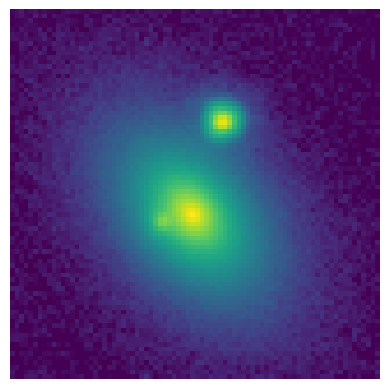

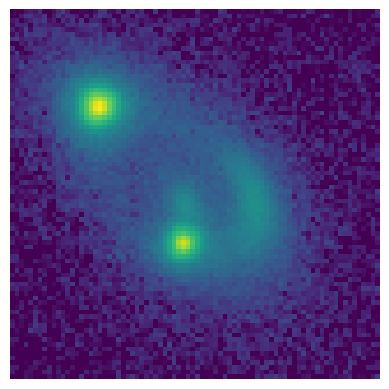

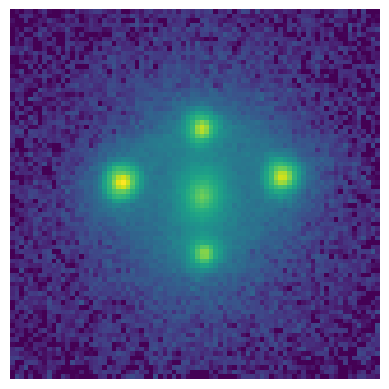

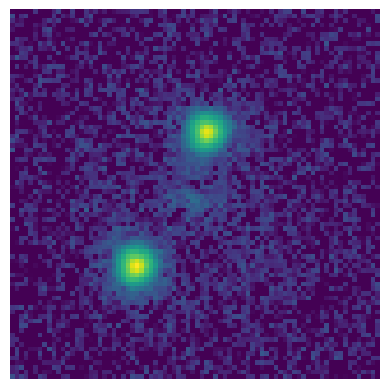

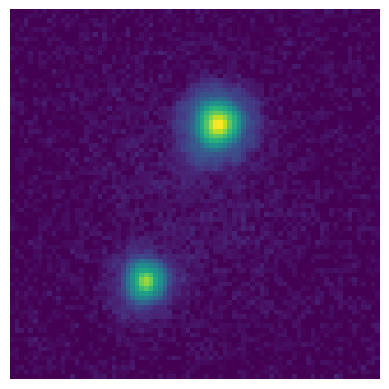

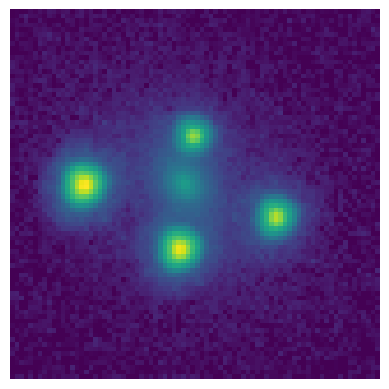

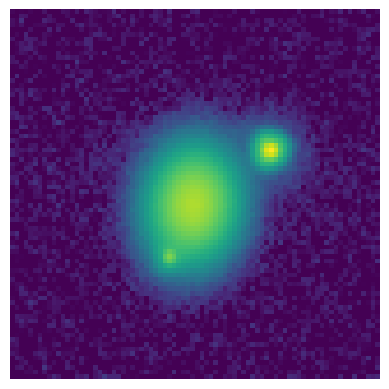

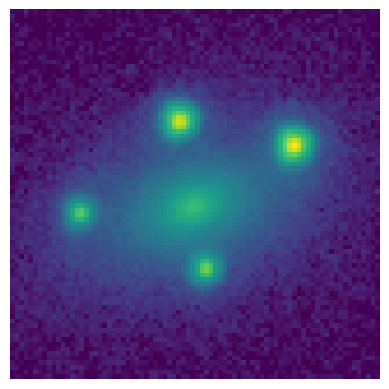

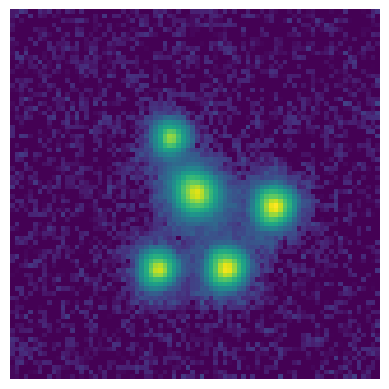

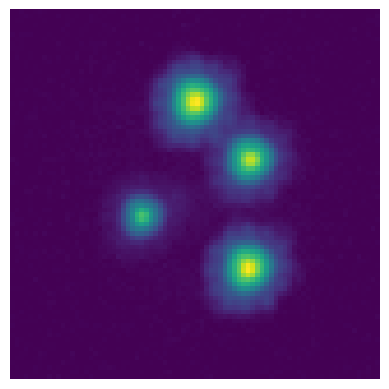

<Figure size 640x480 with 0 Axes>

In [3]:
for i in range(10):
    test_sample_i = ConfigHandler('Configs/test_config-wop_'+str(i)+'.py')
    im,metadata = test_sample_i.draw_image()
    plt.imshow(im,norm=simple_norm(im,stretch='log',min_cut=1e-6))
    plt.axis('off')
    plt.savefig('Images/Paltas_Images_wop/'+str(i)+'.png',bbox_inches='tight')
    plt.figure(i+2)
plt.show()

In [4]:
# generate an image & store it so we can feed it into the neural network

os.system('python /Users/Logan/AppData/Local/Programs/Python/Python312/Lib/site-packages/paltas/paltas/generate.py Configs/test_config-wop_0.py test_sample-wop_image/0 --n 1 --tf_record')
os.system('python /Users/Logan/AppData/Local/Programs/Python/Python312/Lib/site-packages/paltas/paltas/generate.py Configs/test_config-wop_1.py test_sample-wop_image/1 --n 1 --tf_record')
os.system('python /Users/Logan/AppData/Local/Programs/Python/Python312/Lib/site-packages/paltas/paltas/generate.py Configs/test_config-wop_2.py test_sample-wop_image/2 --n 1 --tf_record')
os.system('python /Users/Logan/AppData/Local/Programs/Python/Python312/Lib/site-packages/paltas/paltas/generate.py Configs/test_config-wop_3.py test_sample-wop_image/3 --n 1 --tf_record')
os.system('python /Users/Logan/AppData/Local/Programs/Python/Python312/Lib/site-packages/paltas/paltas/generate.py Configs/test_config-wop_4.py test_sample-wop_image/4 --n 1 --tf_record')
os.system('python /Users/Logan/AppData/Local/Programs/Python/Python312/Lib/site-packages/paltas/paltas/generate.py Configs/test_config-wop_5.py test_sample-wop_image/5 --n 1 --tf_record')
os.system('python /Users/Logan/AppData/Local/Programs/Python/Python312/Lib/site-packages/paltas/paltas/generate.py Configs/test_config-wop_6.py test_sample-wop_image/6 --n 1 --tf_record')
os.system('python /Users/Logan/AppData/Local/Programs/Python/Python312/Lib/site-packages/paltas/paltas/generate.py Configs/test_config-wop_7.py test_sample-wop_image/7 --n 1 --tf_record')
os.system('python /Users/Logan/AppData/Local/Programs/Python/Python312/Lib/site-packages/paltas/paltas/generate.py Configs/test_config-wop_8.py test_sample-wop_image/8 --n 1 --tf_record')
os.system('python /Users/Logan/AppData/Local/Programs/Python/Python312/Lib/site-packages/paltas/paltas/generate.py Configs/test_config-wop_9.py test_sample-wop_image/9 --n 1 --tf_record')
#for i in range(10):
    #plt.imshow(np.load('test_sample-wop_image_'+str(i)+'/image_0000000.npy'))
    #plt.figure(i+2)
#plt.show()

0

### 3) Paltas Model With Perturber ###

{'R_sersic': 0.2208378185027564, 'center_x': -0.022150984846351356, 'center_y': 0.17844322267345983, 'e1': -0.04967942257709707, 'e2': 0.21852700515592277, 'n_sersic': 2.053474997638928, 'amp': 857.2841464751363}
{'R_sersic': 0.7207593085775519, 'center_x': 0.10192896257897938, 'center_y': 0.03280803108465435, 'e1': -0.05651836892185593, 'e2': 0.2665378489478052, 'n_sersic': 4.563981801669355, 'amp': 0.09021199527507286}
{'R_sersic': 0.6414076208744033, 'center_x': -0.0847491471446518, 'center_y': 0.08488525655026392, 'e1': -0.13446096922388204, 'e2': 0.15953982395941643, 'n_sersic': 3.255859377499578, 'amp': 2.4808222613025013}
{'R_sersic': 0.2219170643956449, 'center_x': -0.17491128076982243, 'center_y': -0.15348394078120095, 'e1': -0.1389578524236422, 'e2': 0.03545891062793814, 'n_sersic': 3.6872854694662527, 'amp': 21.249273816031284}
{'R_sersic': 1.1823248952867802, 'center_x': 0.06824310401529718, 'center_y': 0.01312777703697401, 'e1': -0.16062506047605407, 'e2': 0.00486850926961

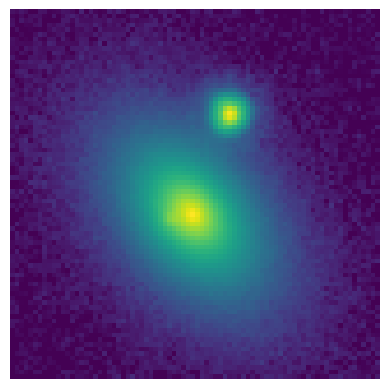

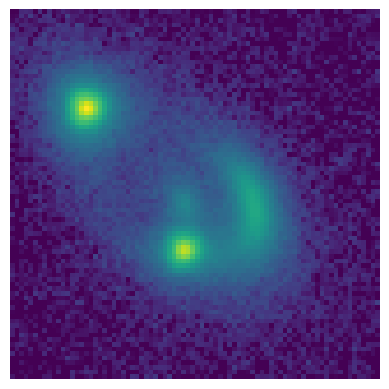

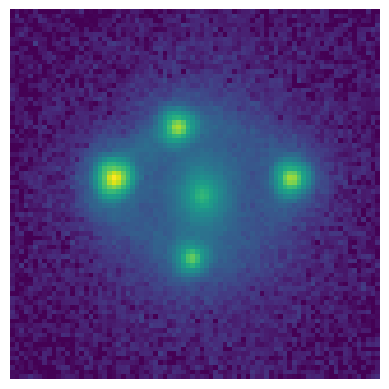

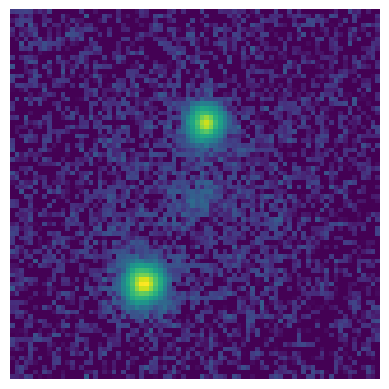

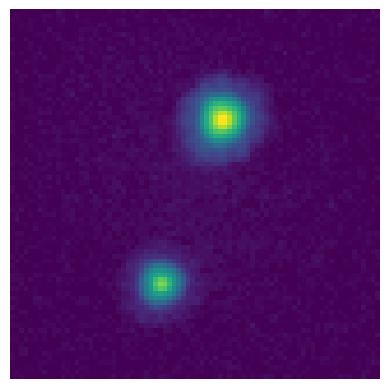

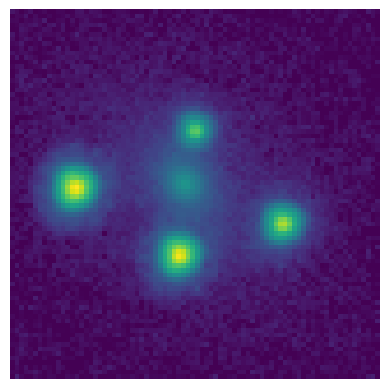

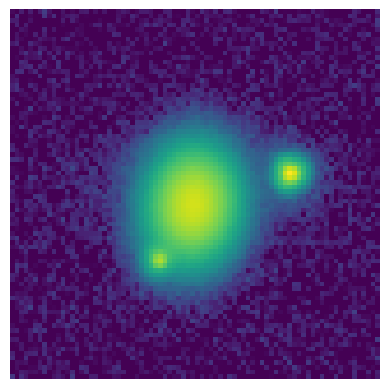

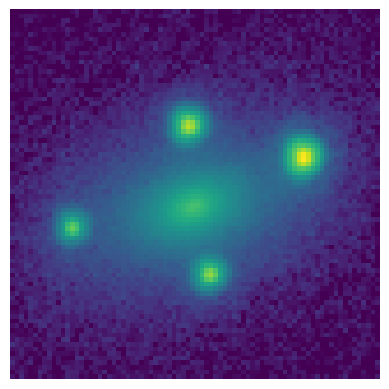

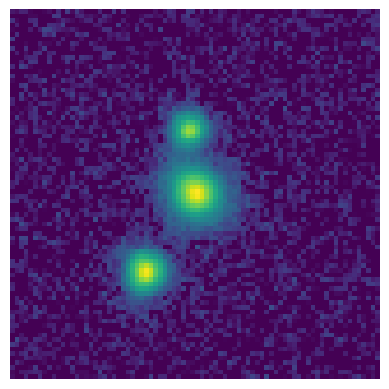

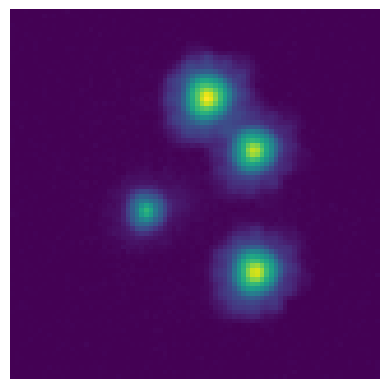

<Figure size 640x480 with 0 Axes>

In [5]:
for i in range(10):
    test_sample_i = ConfigHandler('Configs/test_config-wp_'+str(i)+'.py')
    im,metadata = test_sample_i.draw_image()
    plt.imshow(im,norm=simple_norm(im,stretch='log',min_cut=1e-6))
    plt.axis('off')
    plt.savefig('Images/Paltas_Images_wp/'+str(i)+'.png',bbox_inches='tight')
    plt.figure(i+2)
plt.show()

In [6]:
# generate an image & store it so we can feed it into the neural network

os.system('python /Users/Logan/AppData/Local/Programs/Python/Python312/Lib/site-packages/paltas/paltas/generate.py Configs/test_config-wp_0.py test_sample-wp_image/0 --n 1 --tf_record')
os.system('python /Users/Logan/AppData/Local/Programs/Python/Python312/Lib/site-packages/paltas/paltas/generate.py Configs/test_config-wp_1.py test_sample-wp_image/1 --n 1 --tf_record')
os.system('python /Users/Logan/AppData/Local/Programs/Python/Python312/Lib/site-packages/paltas/paltas/generate.py Configs/test_config-wp_2.py test_sample-wp_image/2 --n 1 --tf_record')
os.system('python /Users/Logan/AppData/Local/Programs/Python/Python312/Lib/site-packages/paltas/paltas/generate.py Configs/test_config-wp_3.py test_sample-wp_image/3 --n 1 --tf_record')
os.system('python /Users/Logan/AppData/Local/Programs/Python/Python312/Lib/site-packages/paltas/paltas/generate.py Configs/test_config-wp_4.py test_sample-wp_image/4 --n 1 --tf_record')
os.system('python /Users/Logan/AppData/Local/Programs/Python/Python312/Lib/site-packages/paltas/paltas/generate.py Configs/test_config-wp_5.py test_sample-wp_image/5 --n 1 --tf_record')
os.system('python /Users/Logan/AppData/Local/Programs/Python/Python312/Lib/site-packages/paltas/paltas/generate.py Configs/test_config-wp_6.py test_sample-wp_image/6 --n 1 --tf_record')
os.system('python /Users/Logan/AppData/Local/Programs/Python/Python312/Lib/site-packages/paltas/paltas/generate.py Configs/test_config-wp_7.py test_sample-wp_image/7 --n 1 --tf_record')
os.system('python /Users/Logan/AppData/Local/Programs/Python/Python312/Lib/site-packages/paltas/paltas/generate.py Configs/test_config-wp_8.py test_sample-wp_image/8 --n 1 --tf_record')
os.system('python /Users/Logan/AppData/Local/Programs/Python/Python312/Lib/site-packages/paltas/paltas/generate.py Configs/test_config-wp_9.py test_sample-wp_image/9 --n 1 --tf_record')
#for i in range(10):
    #plt.imshow(np.load('test_sample-wp_image_'+str(i)+'/image_0000000.npy'))
    #plt.figure(i+2)
#plt.show()

0

### 4) Paltas Model With Perturber Light ###

({'R_sersic': 0.2208378185027564, 'n_sersic': 2.053474997638928, 'e1': -0.04967942257709707, 'e2': 0.21852700515592277, 'center_x': -0.022150984846351356, 'center_y': 0.17844322267345983, 'amp': 857.2841464751363}, {'amp': 29.9385619019969, 'R_sersic': 0.07592075244357199, 'n_sersic': 1.8502723946132715, 'center_x': -0.47096047063707575, 'center_y': 0.18756314751347616})
{'R_sersic': 0.7207593085775519, 'center_x': 0.10192896257897938, 'center_y': 0.03280803108465435, 'e1': -0.05651836892185593, 'e2': 0.2665378489478052, 'n_sersic': 4.563981801669355, 'amp': 0.09021199527507286}
({'R_sersic': 0.6414076208744033, 'n_sersic': 3.255859377499578, 'e1': -0.13446096922388204, 'e2': 0.15953982395941643, 'center_x': -0.0847491471446518, 'center_y': 0.08488525655026392, 'amp': 2.4808222613025013}, {'amp': 29.9385619019969, 'R_sersic': 0.07592075244357199, 'n_sersic': 1.8502723946132715, 'center_x': 0.46886192257269305, 'center_y': -0.9709450540850243})
{'R_sersic': 0.2219170643956449, 'center_x

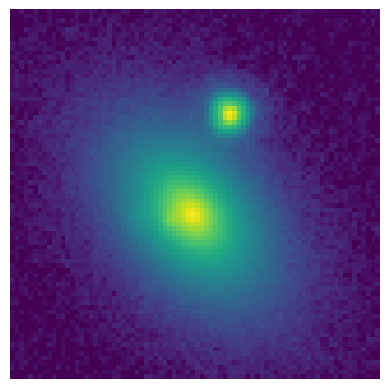

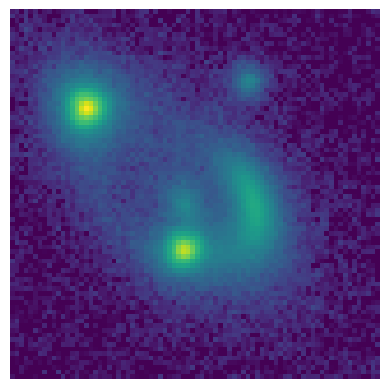

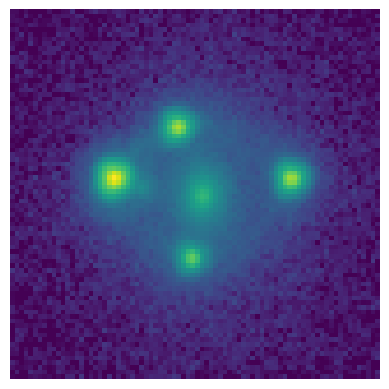

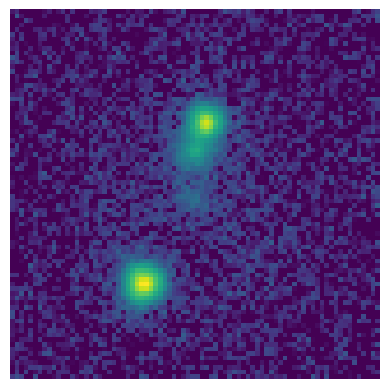

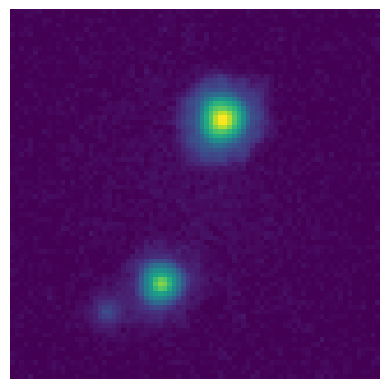

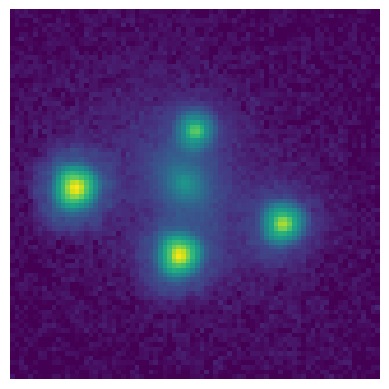

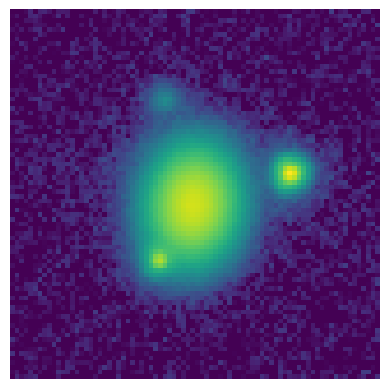

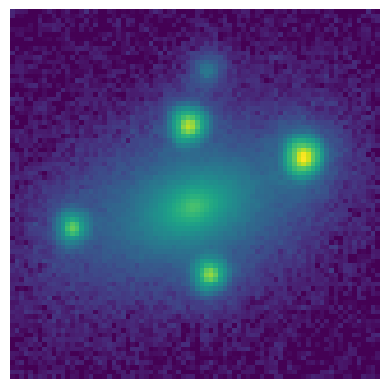

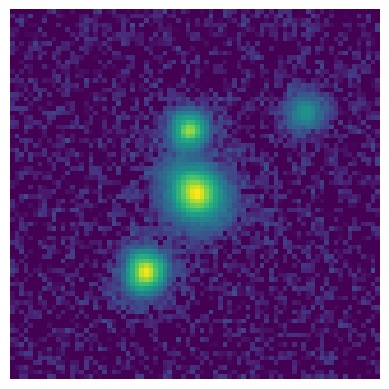

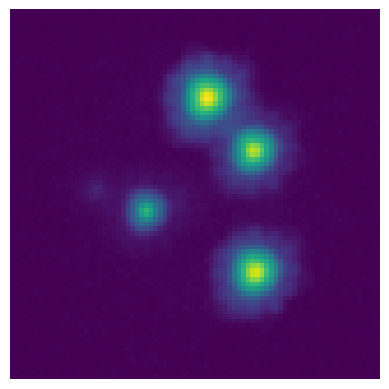

<Figure size 640x480 with 0 Axes>

In [7]:
for i in range(10):
    test_sample_i = ConfigHandler('Configs/test_config-wpl_'+str(i)+'.py')
    im,metadata = test_sample_i.draw_image()
    plt.imshow(im,norm=simple_norm(im,stretch='log',min_cut=1e-6))
    plt.axis('off')
    plt.savefig('Images/Paltas_Images_wpl/'+str(i)+'.png',bbox_inches='tight')
    plt.figure(i+2)
plt.show()

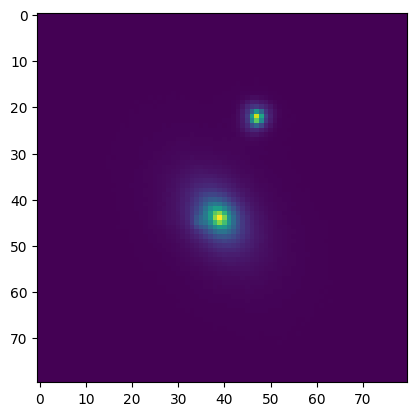

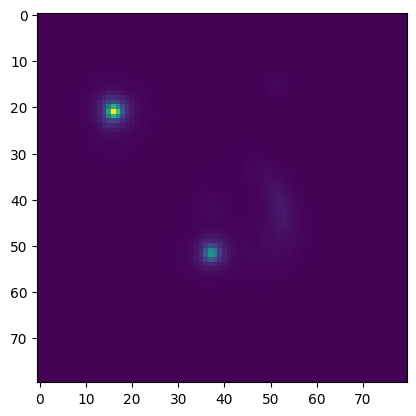

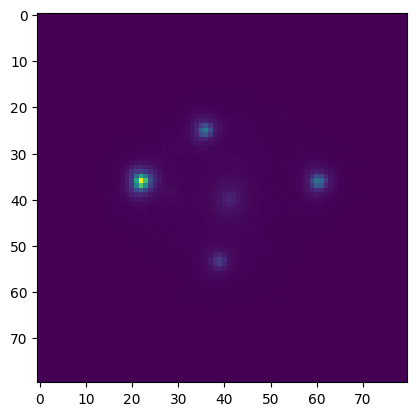

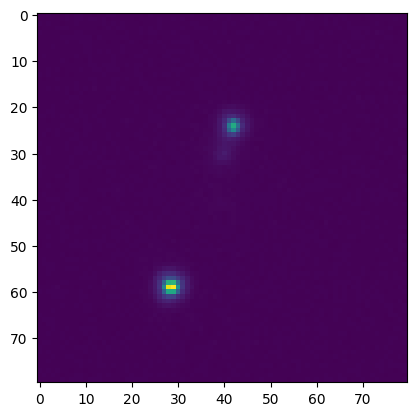

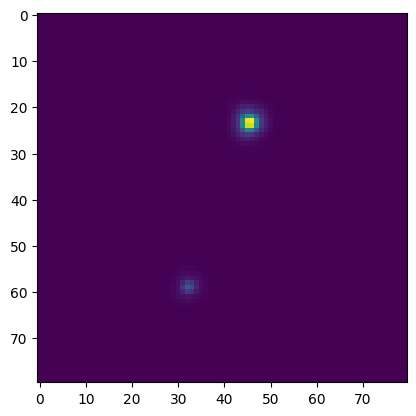

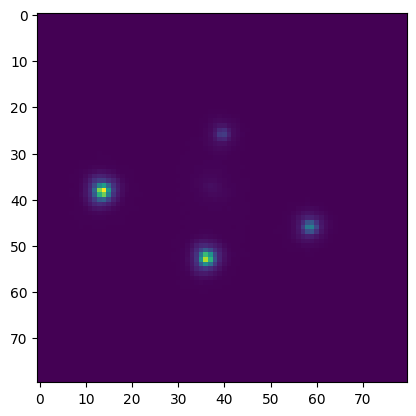

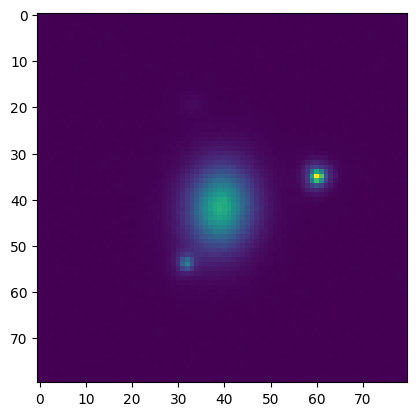

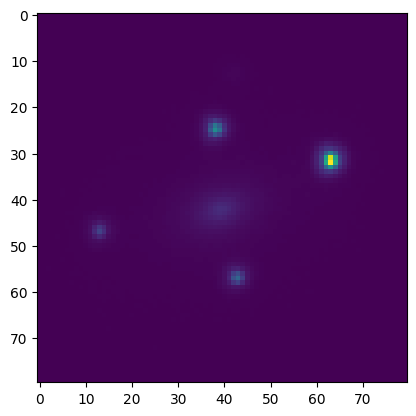

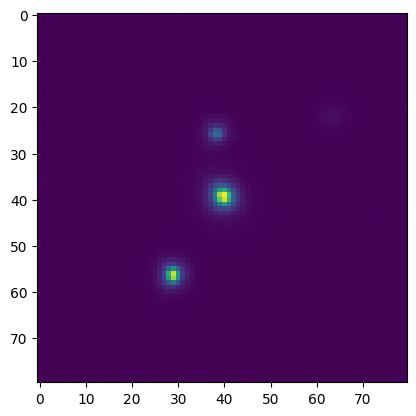

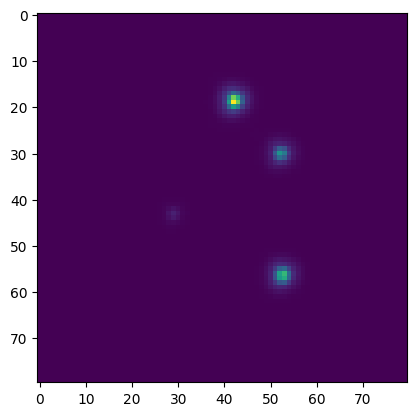

<Figure size 640x480 with 0 Axes>

In [8]:
# generate an image & store it so we can feed it into the neural network

os.system('python /Users/Logan/AppData/Local/Programs/Python/Python312/Lib/site-packages/paltas/paltas/generate.py Configs/test_config-wpl_0.py test_sample-wpl_image/0 --n 1 --tf_record')
os.system('python /Users/Logan/AppData/Local/Programs/Python/Python312/Lib/site-packages/paltas/paltas/generate.py Configs/test_config-wpl_1.py test_sample-wpl_image/1 --n 1 --tf_record')
os.system('python /Users/Logan/AppData/Local/Programs/Python/Python312/Lib/site-packages/paltas/paltas/generate.py Configs/test_config-wpl_2.py test_sample-wpl_image/2 --n 1 --tf_record')
os.system('python /Users/Logan/AppData/Local/Programs/Python/Python312/Lib/site-packages/paltas/paltas/generate.py Configs/test_config-wpl_3.py test_sample-wpl_image/3 --n 1 --tf_record')
os.system('python /Users/Logan/AppData/Local/Programs/Python/Python312/Lib/site-packages/paltas/paltas/generate.py Configs/test_config-wpl_4.py test_sample-wpl_image/4 --n 1 --tf_record')
os.system('python /Users/Logan/AppData/Local/Programs/Python/Python312/Lib/site-packages/paltas/paltas/generate.py Configs/test_config-wpl_5.py test_sample-wpl_image/5 --n 1 --tf_record')
os.system('python /Users/Logan/AppData/Local/Programs/Python/Python312/Lib/site-packages/paltas/paltas/generate.py Configs/test_config-wpl_6.py test_sample-wpl_image/6 --n 1 --tf_record')
os.system('python /Users/Logan/AppData/Local/Programs/Python/Python312/Lib/site-packages/paltas/paltas/generate.py Configs/test_config-wpl_7.py test_sample-wpl_image/7 --n 1 --tf_record')
os.system('python /Users/Logan/AppData/Local/Programs/Python/Python312/Lib/site-packages/paltas/paltas/generate.py Configs/test_config-wpl_8.py test_sample-wpl_image/8 --n 1 --tf_record')
os.system('python /Users/Logan/AppData/Local/Programs/Python/Python312/Lib/site-packages/paltas/paltas/generate.py Configs/test_config-wpl_9.py test_sample-wpl_image/9 --n 1 --tf_record')
for i in range(10):
    plt.imshow(np.load('test_sample-wpl_image/'+str(i)+'/image_0000000.npy'))
    plt.figure(i+2)
plt.show()

### 5) Generate Network Predictions ###

In [9]:
# compute predictions for test sets 
path_to_weights = 'xresnet34_068--14.58.h5'
path_to_norms = 'norms.csv'

learning_params = ['main_deflector_parameters_theta_E','main_deflector_parameters_gamma1',
                   'main_deflector_parameters_gamma2','main_deflector_parameters_gamma',
                   'main_deflector_parameters_e1','main_deflector_parameters_e2',
                   'main_deflector_parameters_center_x','main_deflector_parameters_center_y',
                   'source_parameters_center_x','source_parameters_center_y']
learning_params_names = [r'$\theta_\mathrm{E}$',r'$\gamma_1$',r'$\gamma_2$',r'$\gamma_\mathrm{lens}$',r'$e_1$',
								r'$e_2$',r'$x_{lens}$',r'$y_{lens}$',r'$x_{src}$',r'$y_{src}$']

model_predictions = network_predictions.NetworkPredictions(path_to_weights,path_to_norms,
    learning_params,loss_type='diag',model_type='xresnet34',norm_type='lognorm')

In [10]:
folder_names=[]
for i in range(10):
    folder_names.append(str(i))
#print(folder_names)

In [11]:
#Without Perturber
y_test, y_pred_wop, std_pred_wop, prec_pred_wop = model_predictions.gen_doppel_predictions(test_folder='test_sample-wop_image',doppel_names=folder_names)

# NOTE: there is a mismatch in the coordinate system, so I have to transform x,y predictions accordingly (this doesn't change the results)
# x-coords
#y_pred_wop[:,6] = - (y_pred_wop[:,6]-0.02)
#y_pred_wop[:,8] = - (y_pred_wop[:,8]-0.02)
# y-coords
#y_pred_wop[:,7] = - (y_pred_wop[:,7]+0.02)
#y_pred_wop[:,9] = - (y_pred_wop[:,9]+0.02)

#With Perturber
y_test_wp, y_pred_wp, std_pred_wp, prec_pred_wp = model_predictions.gen_doppel_predictions(test_folder='test_sample-wp_image',doppel_names=folder_names)

# x-coords
#y_pred_wp[:,6] = - (y_pred_wp[:,6]-0.02)
#y_pred_wp[:,8] = - (y_pred_wp[:,8]-0.02)
# y-coords
#y_pred_wp[:,7] = - (y_pred_wp[:,7]+0.02)
#y_pred_wp[:,9] = - (y_pred_wp[:,9]+0.02)

#With Pertuber Light
y_test_wpl, y_pred_wpl, std_pred_wpl, prec_pred_wpl = model_predictions.gen_doppel_predictions(test_folder='test_sample-wpl_image',doppel_names=folder_names)

# x-coords
#y_pred_wpl[:,6] = - (y_pred_wpl[:,6]-0.02)
#y_pred_wpl[:,8] = - (y_pred_wpl[:,8]-0.02)
# y-coords
#y_pred_wpl[:,7] = - (y_pred_wpl[:,7]+0.02)
#y_pred_wpl[:,9] = - (y_pred_wpl[:,9]+0.02)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━

In [12]:
print('ground truth: ', y_test)
print('wop-prediction: ', y_pred_wop)
print('wp-prediction: ', y_pred_wp)
print('wpl-prediction: ', y_pred_wpl)

ground truth:  [[ 0.5265766  -0.10264334 -0.03704098  1.8882008   0.31413767  0.05627273
  -0.02215098  0.17844322  0.10192896  0.03280803]
 [ 0.6135685   0.07258933  0.27006805  2.0777063  -0.01733696  0.01633648
  -0.08474914  0.08488525 -0.17491128 -0.15348394]
 [ 0.61544347  0.11085135 -0.01863047  2.074065   -0.10346319 -0.01412109
   0.0682431   0.01312778  0.0582607  -0.02933749]
 [ 0.70039076 -0.11785582  0.09009579  2.0310953  -0.2528003   0.16108768
   0.0024786   0.0507522  -0.06610409  0.138154  ]
 [ 0.7806016  -0.02611214  0.15478827  2.0958748   0.0385497   0.39201912
  -0.03342398 -0.0925317  -0.13678384  0.10982557]
 [ 0.6345488   0.2305926   0.09539412  2.0980847  -0.1750941  -0.01299605
  -0.08312782 -0.08288214 -0.08889268 -0.00236589]
 [ 0.6559611   0.15318052 -0.05026884  2.1227658   0.12641498 -0.115321
  -0.01214809  0.09242847  0.05744677 -0.02307071]
 [ 0.7992411   0.09405545 -0.16794464  2.0307007  -0.23330188 -0.05422356
  -0.01171042  0.11392928 -0.03375032 

### 6) Calculate Metrics ###

In [16]:
param_num = 10
##ME - Median Error
param_diff=[]
for i in range(10):
    param_diff.append(y_pred_wop[i]-y_test[i])
#print(param_diff)
sum=0
for i in param_diff:
    #print(i)
    sum=sum+i
median=(sum/param_num)
ME_wop = list(np.round(median,2))
#print(ME_wop)

param_diff=[]
for i in range(10):
    param_diff.append(y_pred_wp[i]-y_test[i])
sum=0
for i in param_diff:
    sum=sum+i
median=(sum/param_num)
ME_wp = list(np.round(median,2))
#print(ME_wp)

param_diff=[]
for i in range(10):
    param_diff.append(y_pred_wpl[i]-y_test[i])
sum=0
for i in param_diff:
    sum=sum+i
median=(sum/param_num)
ME_wpl = list(np.round(median,2))
#print(ME_wpl)

##MAE - Median Absolute Error
param_diff_abs=[]
for i in range(10):
    param_diff_abs.append(abs(y_pred_wop[i]-y_test[i]))
#print(param_diff_abs)
sum=0
for i in param_diff_abs:
    sum=sum+i
median=(sum/param_num)
MAE_wop = list(np.round(median,2))
#print(MAE_wop)

param_diff_abs=[]
for i in range(10):
    param_diff_abs.append(abs(y_pred_wp[i]-y_test[i]))
sum=0
for i in param_diff_abs:
    sum=sum+i
median=(sum/param_num)
MAE_wp = list(np.round(median,2))
#print(MAE_wp)

param_diff_abs=[]
for i in range(10):
    param_diff_abs.append(abs(y_pred_wpl[i]-y_test[i]))
sum=0
for i in param_diff_abs:
    sum=sum+i
median=(sum/param_num)
MAE_wpl = list(np.round(median,2))
#print(MAE_wpl)

##Msigma - Median Standard Deviation
#print(std_pred_wop)
sum=0
for i in std_pred_wop:
    sum=sum+i
median=(sum/param_num)
Mstd_wop = list(np.round(median,2))
#print(Mstd_wop)

##Msigma - Median Standard Deviation
sum=0
for i in std_pred_wp:
    sum=sum+i
median=(sum/param_num)
Mstd_wp = list(np.round(median,2))
#print(Mstd_wp)

##Msigma - Median Standard Deviation
sum=0
for i in std_pred_wpl:
    sum=sum+i
median=(sum/param_num)
Mstd_wpl = list(np.round(median,2))
#print(Mstd_wpl)

metrics = [ME_wop, ME_wp, ME_wpl, MAE_wop, MAE_wp, MAE_wpl, Mstd_wop, Mstd_wp, Mstd_wpl]
print(metrics)
#np.savetxt('metrics_base.csv', metrics, fmt="%1.2f", delimiter=",")

[[-0.01, -0.01, -0.02, 0.02, -0.03, -0.03, 0.0, -0.0, 0.01, -0.01], [0.03, 0.02, -0.02, 0.03, 0.03, -0.04, -0.0, -0.01, 0.01, 0.01], [0.15, -0.06, -0.11, -0.17, -0.07, -0.12, -0.01, -0.05, -0.01, -0.03], [0.02, 0.03, 0.04, 0.07, 0.05, 0.06, 0.0, 0.0, 0.01, 0.01], [0.04, 0.05, 0.04, 0.08, 0.1, 0.07, 0.01, 0.01, 0.03, 0.03], [0.15, 0.1, 0.14, 0.19, 0.18, 0.17, 0.03, 0.06, 0.03, 0.04], [0.02, 0.04, 0.04, 0.14, 0.08, 0.07, 0.01, 0.01, 0.02, 0.02], [0.02, 0.05, 0.05, 0.14, 0.09, 0.08, 0.01, 0.01, 0.02, 0.02], [0.06, 0.08, 0.07, 0.16, 0.12, 0.1, 0.02, 0.02, 0.04, 0.03]]


### 7) Interpret Output from the Network

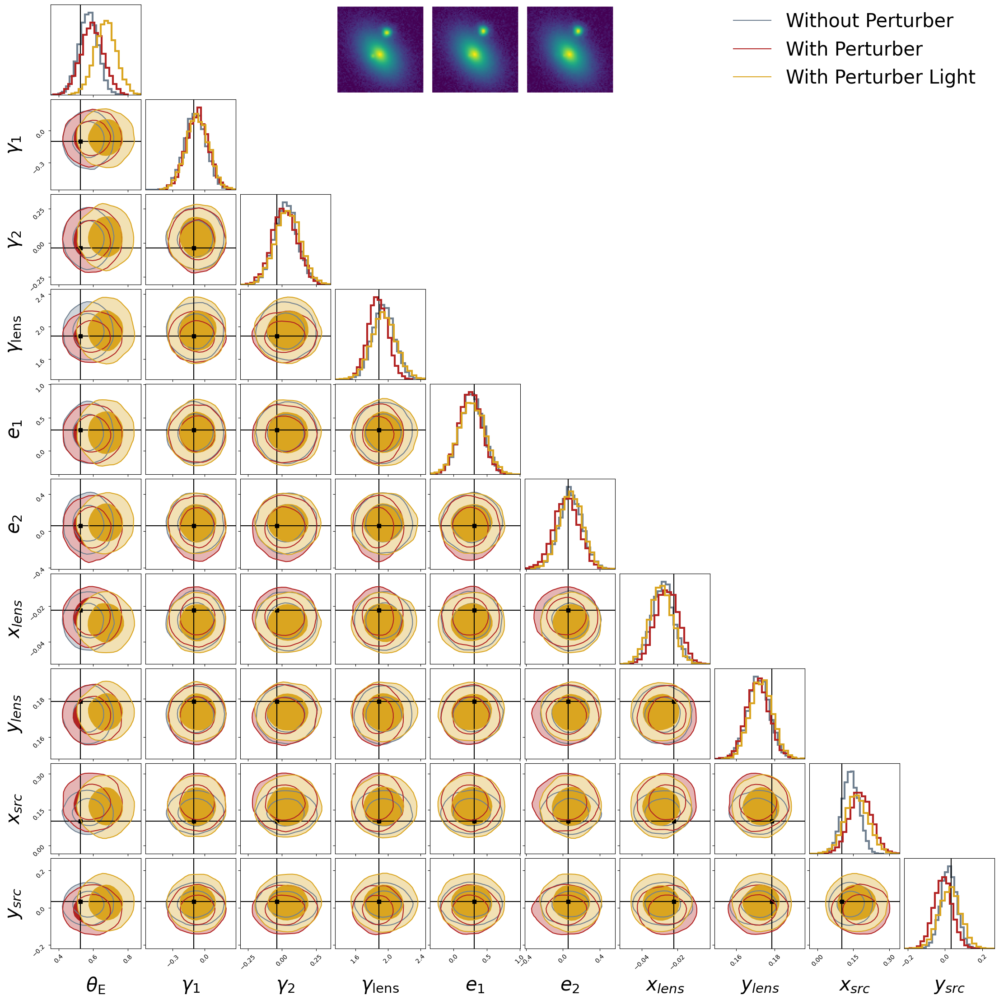

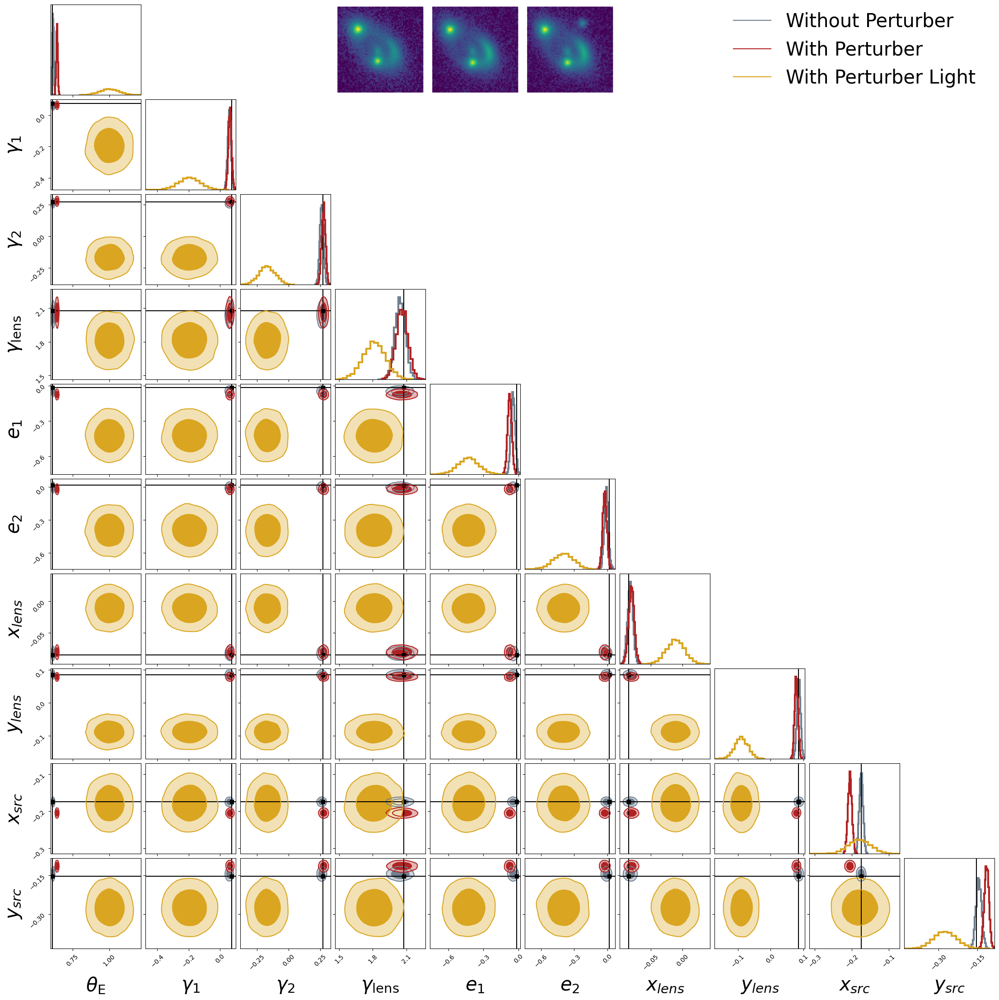

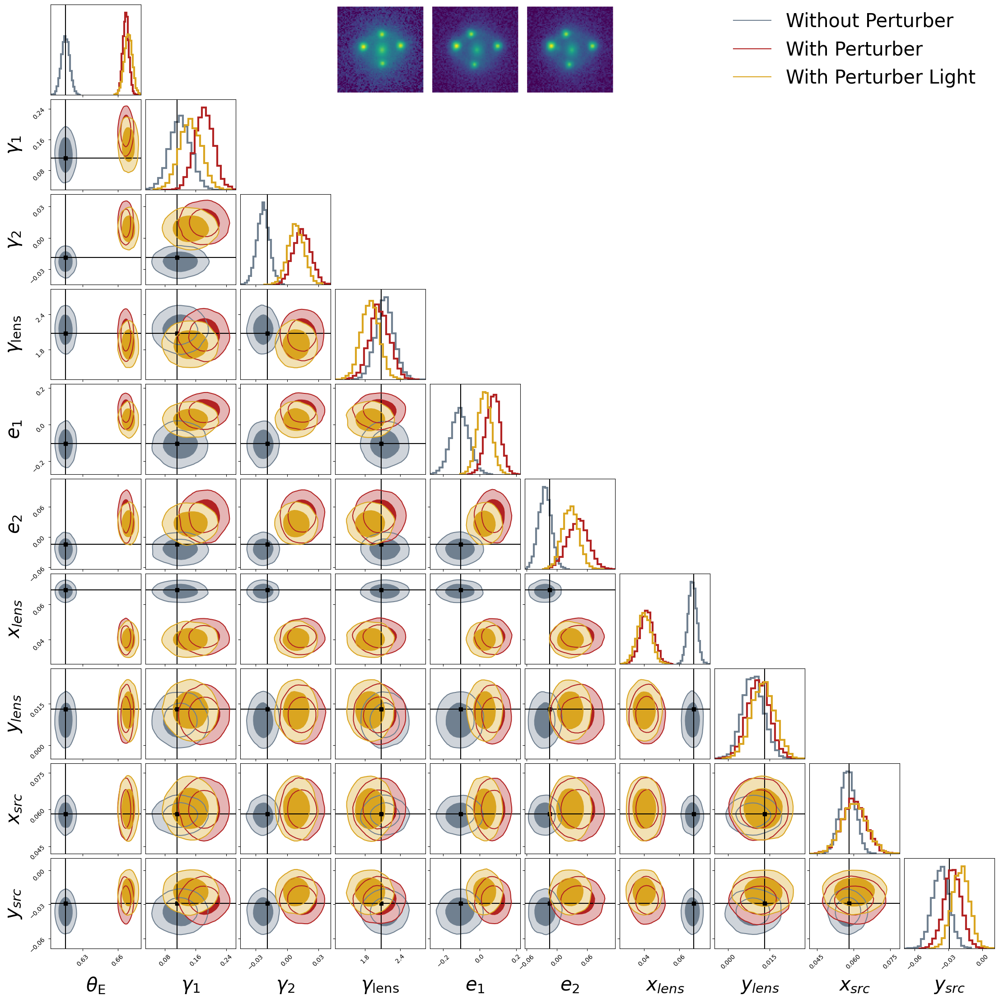

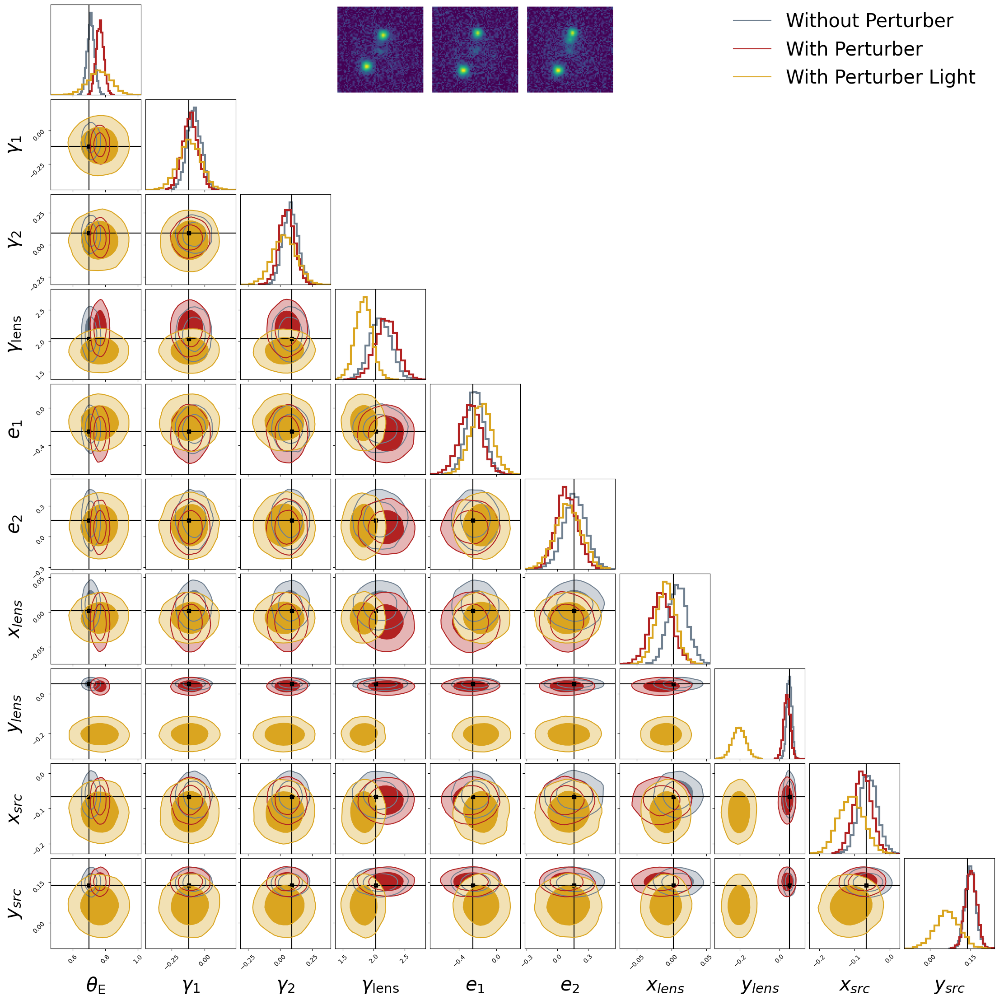

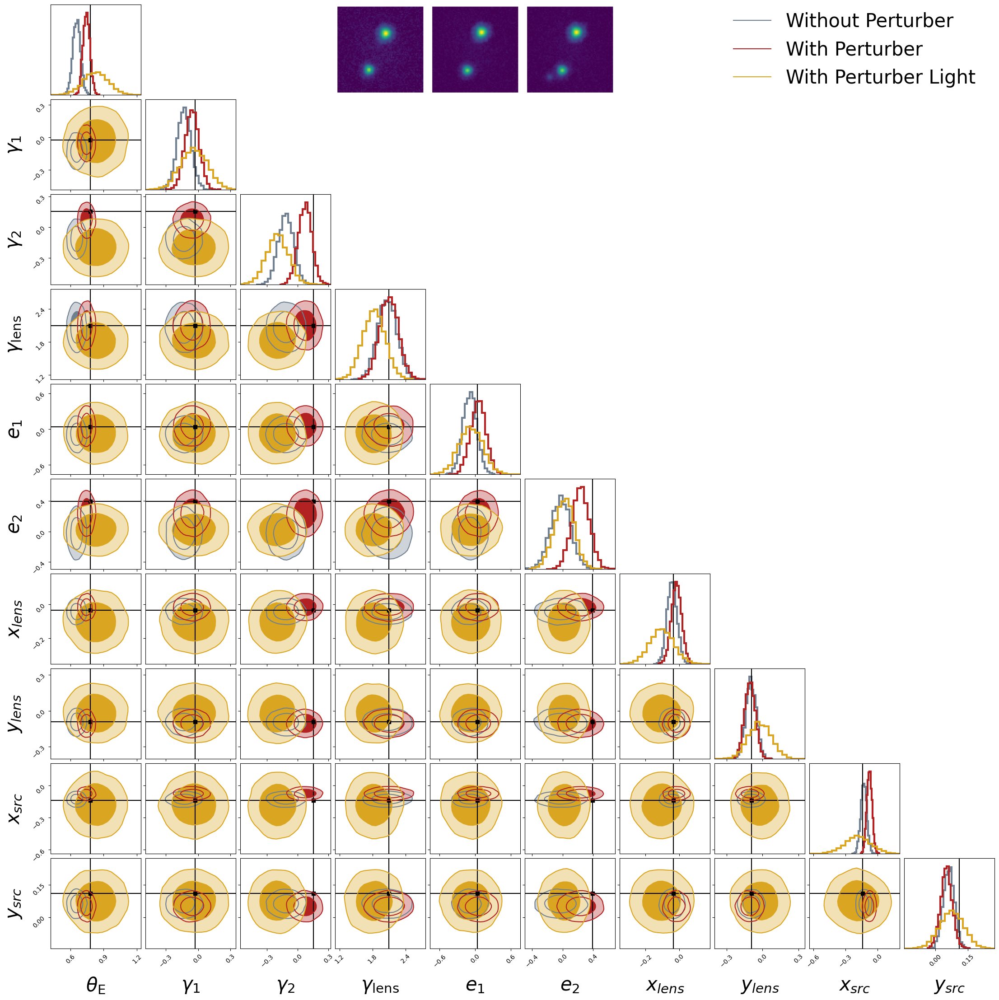

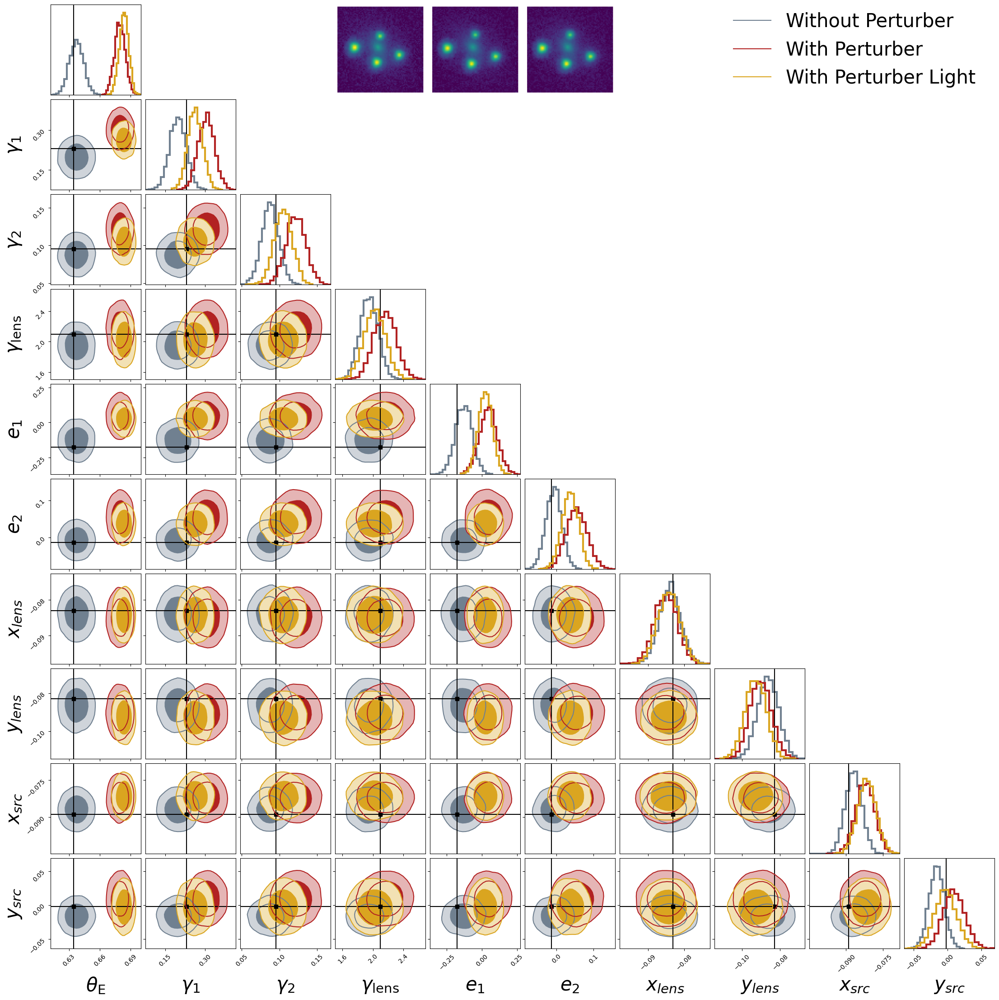

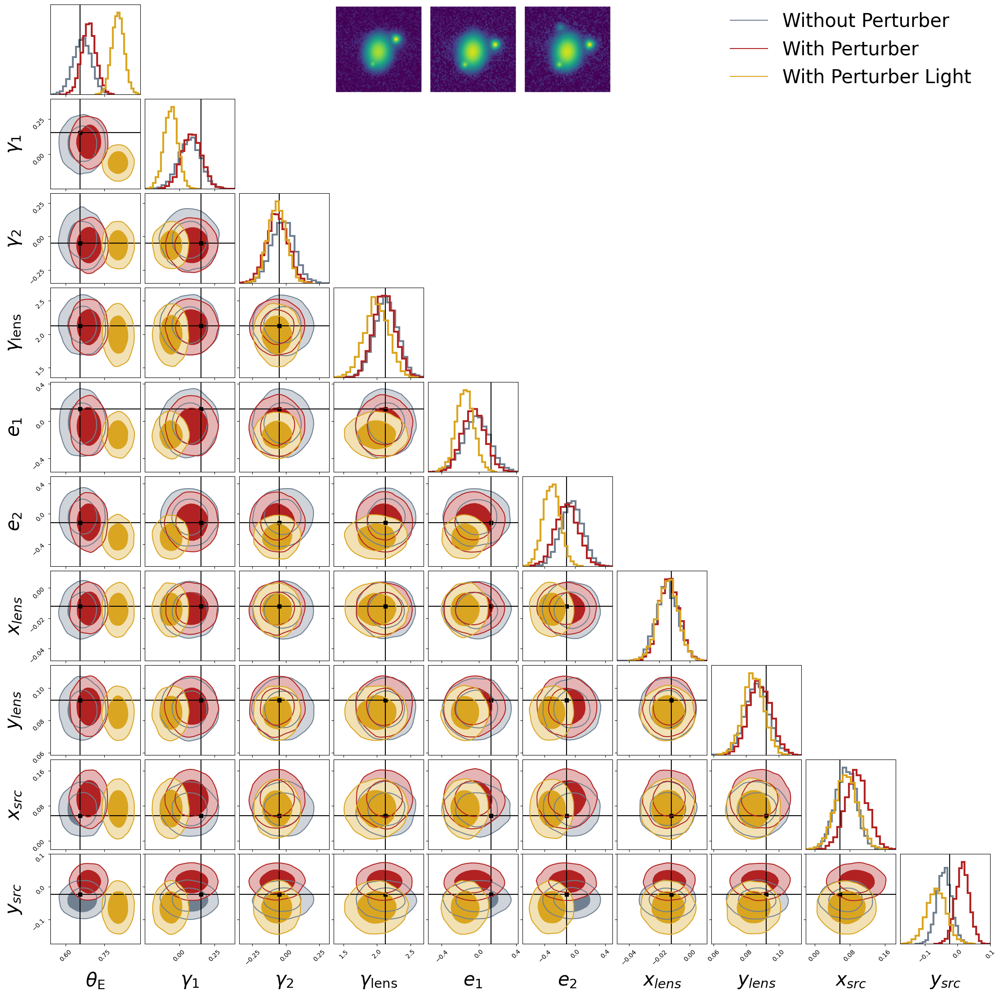

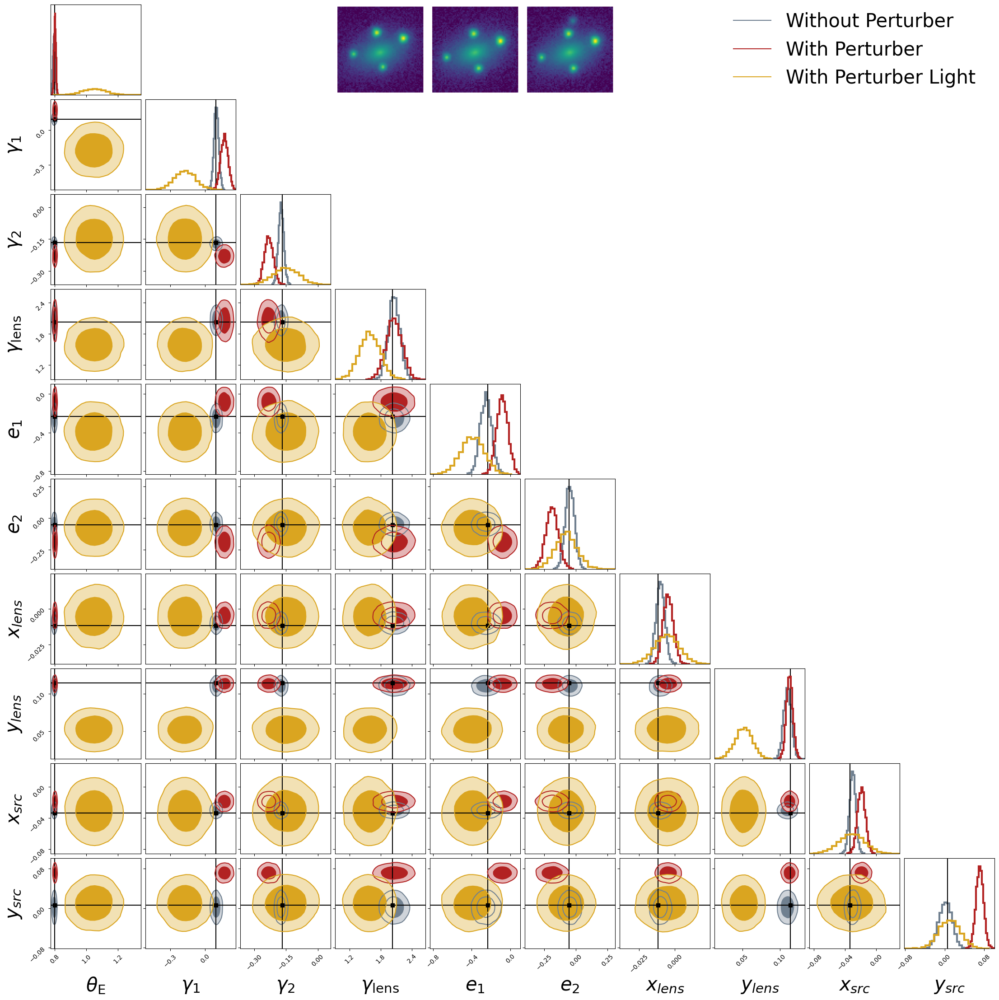

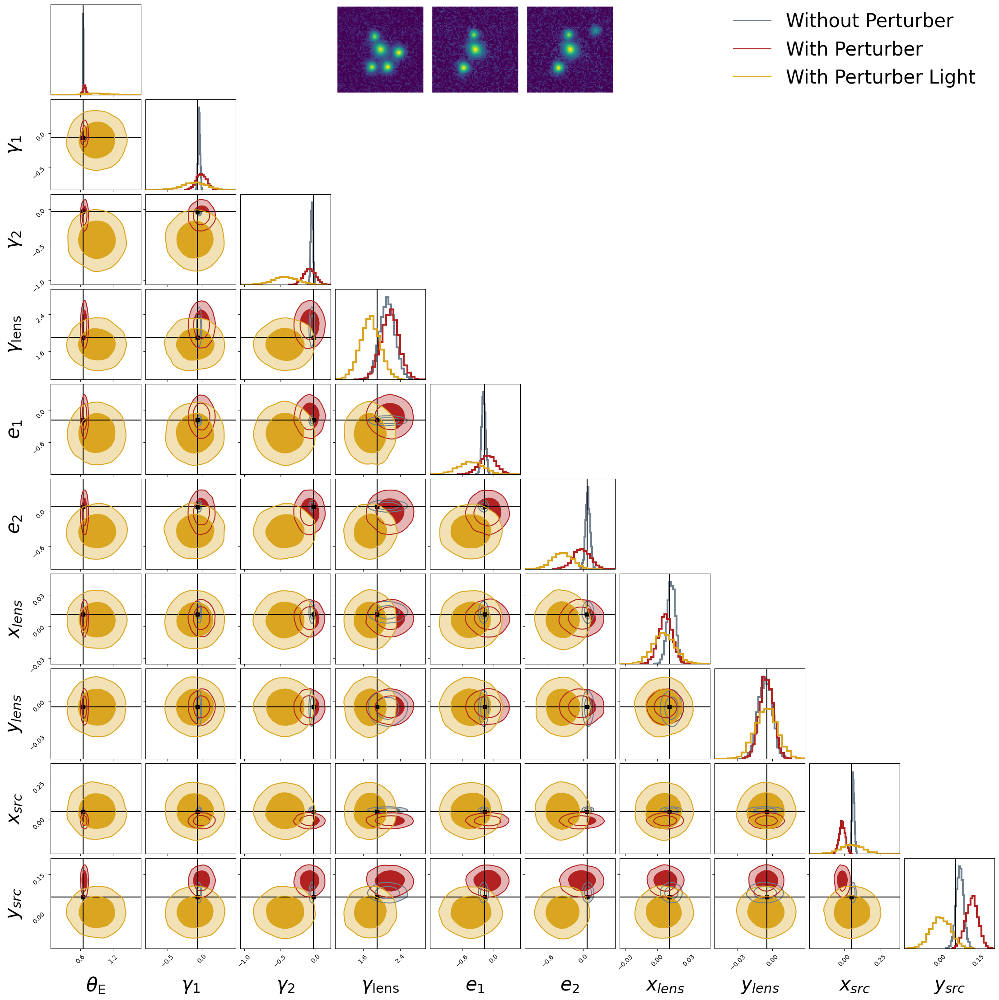

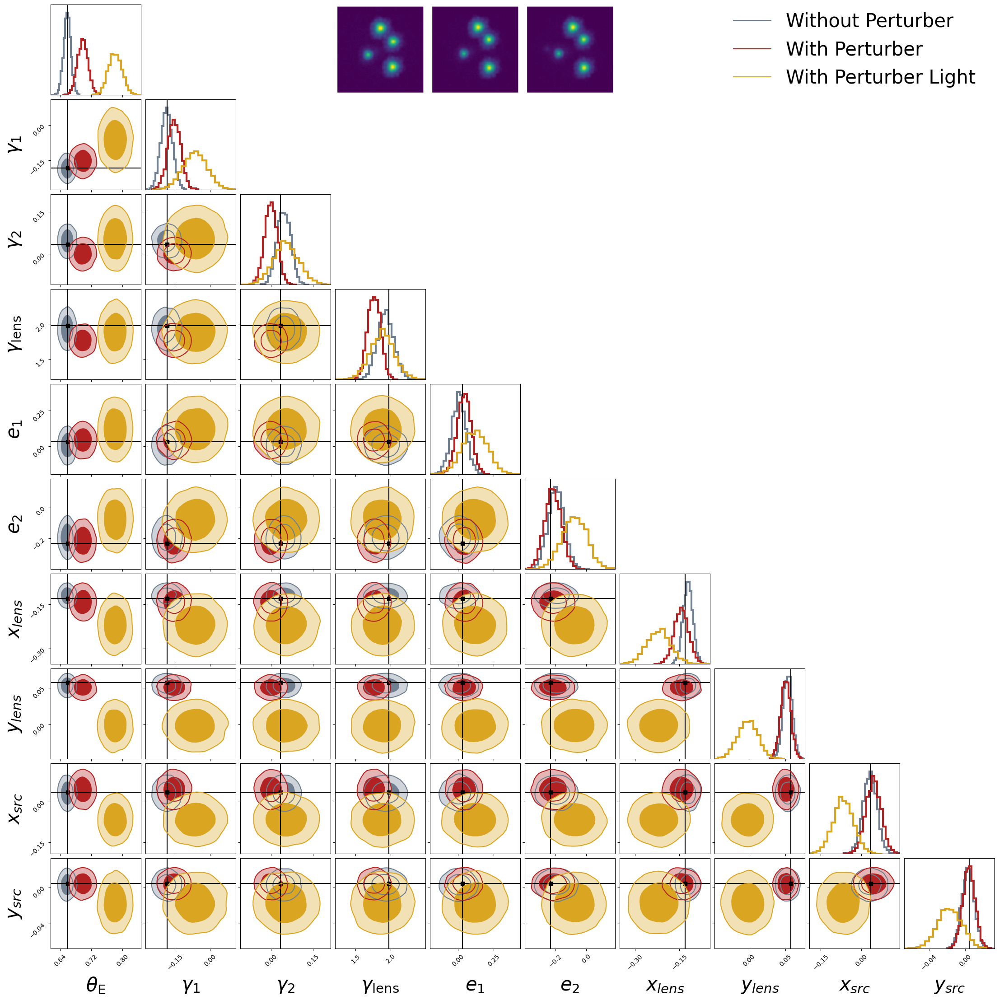

In [14]:
num_params = 10
for i in range(10):
    posterior_samples_wop = multivariate_normal(mean=y_pred_wop[i],cov=np.linalg.inv(prec_pred_wop[i])).rvs(size=int(5e3))
    posterior_samples_wp = multivariate_normal(mean=y_pred_wp[i],cov=np.linalg.inv(prec_pred_wp[i])).rvs(size=int(5e3))
    posterior_samples_wpl = multivariate_normal(mean=y_pred_wpl[i],cov=np.linalg.inv(prec_pred_wpl[i])).rvs(size=int(5e3))

    fig = corner.corner(posterior_samples_wop,labels=np.asarray(learning_params_names),bins=20,
                show_titles=False,plot_datapoints=False,label_kwargs=dict(fontsize=30),
                levels=[0.68,0.95],color='slategray',fill_contours=True,smooth=1.0,
                hist_kwargs={'density':True,'color':'slategray','lw':3},title_fmt='.2f',max_n_ticks=3,fig=None,
                truths=y_test[i],
                truth_color='black')
    corner.corner(posterior_samples_wp,labels=np.asarray(learning_params_names),bins=20,
                show_titles=False,plot_datapoints=False,label_kwargs=dict(fontsize=30),
                levels=[0.68,0.95],color='firebrick',fill_contours=True,smooth=1.0,
                hist_kwargs={'density':True,'color':'firebrick','lw':3},title_fmt='.2f',max_n_ticks=3,fig=fig)
    corner.corner(posterior_samples_wpl,labels=np.asarray(learning_params_names),bins=20,
                show_titles=False,plot_datapoints=False,label_kwargs=dict(fontsize=30),
                levels=[0.68,0.95],color='goldenrod',fill_contours=True,smooth=1.0,
                hist_kwargs={'density':True,'color':'goldenrod','lw':3},title_fmt='.2f',max_n_ticks=3,fig=fig)

    color = ['slategray', 'firebrick', 'goldenrod']
    label = ['Without Perturber', 'With Perturber', 'With Perturber Light']
    axes = np.array(fig.axes).reshape(num_params, num_params)
    axes[0,num_params-2].legend(handles=[mlines.Line2D([], [], color=color[i], label=label[i]) for i in range(0,3)],frameon=False,
                fontsize=30,loc=10)

    im_wop = plt.imread('Images/Paltas_Images_wop/'+str(i)+'.png')
    im_wp = plt.imread('Images/Paltas_Images_wp/'+str(i)+'.png')
    im_wpl = plt.imread('Images/Paltas_Images_wpl/'+str(i)+'.png')
    axes[0,3].imshow(im_wop)
    axes[0,4].imshow(im_wp)
    axes[0,5].imshow(im_wpl)

    plt.savefig('Images/test_sample/corner_plot_'+str(i)+'.png')